In [1]:
import pandas as pd
import os
import random
import numpy as np
import pickle
import subprocess

import matplotlib.pyplot as plt
import seaborn as sns

/home/tbellagio/.local/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
pwd

'/home/tbellagio/simulations/cline_creation'

In [3]:
dict_files = [i for i in os.listdir('results/') if 'run' in i]
all_params = {}
for i in dict_files:
    runid = i.replace('run_', '').replace('.txt', '').replace('self', '')
    if len(runid)>5: ## this are all the selfers 
        params = pd.read_csv(f'results/{i}',header=None)[0].values[0].split('_')
        all_params[runid] = params
runids = list(all_params.keys())

In [4]:
processed = [i.split('_')[-2].replace('.csv', '') for i in os.listdir('lfmm/results/') if 'wo_calibration' in i]

In [5]:
left = set(runids) - set(processed)
len(left)

0

In [6]:
left = {'101619',
 '106349',
 '111579',
 '139592',
 '154483',
 '155541',
 '163090',
 '163561',
 '173654',
 '189069',
 '205645',
 '218736',
 '222145',
 '226152',
 '247997',
 '250193',
 '250322',
 '279586',
 '280689',
 '284179',
 '289531',
 '297441',
 '300061',
 '300776',
 '309679',
 '316942',
 '320202',
 '321040',
 '363121',
 '371066',
 '374725',
 '376662',
 '376718',
 '383308',
 '386165',
 '411687',
 '432712',
 '445655',
 '462019',
 '500219',
 '515999',
 '540125',
 '549106',
 '593131',
 '593967',
 '594913',
 '603395',
 '610490',
 '649580',
 '660652',
 '664124',
 '691638',
 '702492',
 '703194',
 '707826',
 '709542',
 '722109',
 '739445',
 '747737',
 '759603',
 '763425',
 '771355',
 '787769',
 '789601',
 '790333',
 '791029',
 '793549',
 '808608',
 '817291',
 '822248',
 '823280',
 '829775',
 '875216',
 '883445',
 '898516',
 '921476',
 '926430',
 '944672',
 '966338',
 '972359'}

In [7]:
pop_env = {'pop1':-2, 'pop2':-1.5, 'pop3':-1, 'pop4':-0.5, 'pop5':0, 'pop6':0.5, 'pop7':1, 'pop8':1.5, 'pop9':2}

for runid in left:
    print(runid)
    with open(f'results/pop_counts/population_counts_{runid}.pkl', 'rb') as file:
        population_counts = pickle.load(file)
        
    total_genomes = sum(dict(population_counts).values()) * 2
    all_alt_allele_count = pd.read_csv(f'results/alleles_df/all_alt_allele_count_{runid}.csv').set_index('Unnamed: 0')

    print(all_alt_allele_count.shape)
    min_freq = 0.05
    min_count = total_genomes * min_freq
    #print(all_alt_allele_count.shape)
    all_alt_allele_count = all_alt_allele_count[all_alt_allele_count.sum(axis=1) > min_count]
    print(all_alt_allele_count.shape)
    all_alt_allele_count.to_csv(f'lfmm/allele_counts/all_alt_allele_counts_runid_{runid}.csv',index=None)
    f'all_alt_allele_counts_runid_{runid}.csv'

    #if 15005 in all_alt_allele_count.index:  
        #print(all_alt_allele_count.loc[15005])
    
    #print(all_alt_allele_count.shape)
    env_var = pd.Series(list(all_alt_allele_count.columns.map(pop_env)))
    env_var.to_csv(f'lfmm/env_files/env_var_{runid}.csv',index=None, header=None)
    print(env_var.shape)
    left_pos = all_alt_allele_count.index
    left_pos = pd.Series(left_pos).reset_index()
    left_pos.columns = ['ignore', 'chrom_pos_left']
    
    left_pos.to_csv(f'lfmm/left_pos/left_pos_{runid}.csv',index=None)

222145
(47249, 17)
(5702, 17)
(17,)
300061
(47059, 17)
(5526, 17)
(17,)
822248
(47325, 17)
(5451, 17)
(17,)
363121
(44470, 17)
(5527, 17)
(17,)
250322
(55325, 17)
(5435, 17)
(17,)
793549
(47158, 17)
(5535, 17)
(17,)
300776
(51516, 17)
(5455, 17)
(17,)
462019
(52108, 17)
(5535, 17)
(17,)
155541
(56199, 17)
(5481, 17)
(17,)
707826
(47198, 17)
(5697, 17)
(17,)
163090
(45230, 17)
(5291, 17)
(17,)
320202
(51582, 17)
(5675, 17)
(17,)
154483
(47320, 17)
(5329, 17)
(17,)
771355
(44193, 17)
(5581, 17)
(17,)
101619
(45088, 17)
(5747, 17)
(17,)
386165
(55819, 17)
(5531, 17)
(17,)
789601
(50977, 17)
(5479, 17)
(17,)
966338
(47483, 17)
(5693, 17)
(17,)
921476
(43941, 17)
(5447, 17)
(17,)
106349
(51117, 17)
(5446, 17)
(17,)
747737
(51336, 17)
(5450, 17)
(17,)
280689
(47153, 17)
(5357, 17)
(17,)
759603
(47023, 17)
(5691, 17)
(17,)
411687
(45842, 17)
(5560, 17)
(17,)
111579
(47053, 17)
(5866, 17)
(17,)
829775
(44675, 17)
(5540, 17)
(17,)
610490
(45891, 17)
(5484, 17)
(17,)
603395
(47497, 17)
(5603, 17

In [448]:
best = ['4459', '1062', '9990', '9550', '4067', '9195', '5579', '4846',
       '1217', '8258', '9315', '1604', '9880', '6641', '9212', '1882',
       '9227', '5880', '1772', '7580', '7026', '8697', '3908', '9455',
       '9760', '5623', '2469', '2351', '3507']# Generate the sequence of values from -2 to 2 with steps of 0.25
values = [round(i, 2) for i in list(seq(-2, 2, by=0.25))]

# Create the dictionary using a dictionary comprehension
pop_env = {f'pop{i+1}': values[i] for i in range(len(values))}

# Print the dictionary
print(pop_env)

NameError: name 'seq' is not defined

In [8]:
# Generate the sequence from -2 to 2 with steps of 0.25
sequence = np.arange(-2, 2.25, 0.25)  # 2.25 to include 2 in the sequence

# Create the dictionary
pop_env = {f'pop{index+1}': value for index, value in enumerate(sequence)}
pop_env

{'pop1': -2.0,
 'pop2': -1.75,
 'pop3': -1.5,
 'pop4': -1.25,
 'pop5': -1.0,
 'pop6': -0.75,
 'pop7': -0.5,
 'pop8': -0.25,
 'pop9': 0.0,
 'pop10': 0.25,
 'pop11': 0.5,
 'pop12': 0.75,
 'pop13': 1.0,
 'pop14': 1.25,
 'pop15': 1.5,
 'pop16': 1.75,
 'pop17': 2.0}

In [57]:
#pop_env = {'pop1':-2, 'pop2':-1.5, 'pop3':-1, 'pop4':-0.5, 'pop5':0, 'pop6':0.5, 'pop7':1, 'pop8':1.5, 'pop9':2}

for runid in left:
    print(runid)
    with open(f'results/pop_counts/population_counts_{runid}.pkl', 'rb') as file:
        population_counts = pickle.load(file)
        
    total_genomes = sum(dict(population_counts).values()) * 2
    all_alt_allele_count = pd.read_csv(f'results/alleles_df/all_alt_allele_count_{runid}.csv').set_index('Unnamed: 0')

    
    min_freq = 0.05
    min_count = total_genomes * min_freq
    og_snp_count = all_alt_allele_count.shape[0]
    print('initial size:' + str(all_alt_allele_count.shape))
    all_alt_allele_count = all_alt_allele_count[all_alt_allele_count.sum(axis=1) > min_count]
    new_snp_count = all_alt_allele_count.shape[0]
    print('filtered 0.05 size: '+ str(new_snp_count))
    print('percentage left: '+ str((new_snp_count * 100 ) / og_snp_count))
    
    all_alt_allele_count.to_csv(f'lfmm/allele_counts/all_alt_allele_counts_runid_{runid}.csv',index=None)
    f'all_alt_allele_counts_runid_{runid}.csv'

    #if 15005 in all_alt_allele_count.index:  
        #print(all_alt_allele_count.loc[15005])
    
    #print(all_alt_allele_count.shape)
    env_var = pd.Series(list(all_alt_allele_count.columns.map(pop_env)))
    env_var.to_csv(f'lfmm/env_files/env_var_{runid}.csv',index=None, header=None)
    print(env_var.shape)
    left_pos = all_alt_allele_count.index
    left_pos = pd.Series(left_pos).reset_index()
    left_pos.columns = ['ignore', 'chrom_pos_left']
    
    left_pos.to_csv(f'lfmm/left_pos/left_pos_{runid}.csv',index=None)

222145
initial size:(47249, 17)
filtered 0.05 size: 5702
percentage left: 12.06798027471481
(17,)
300061
initial size:(47059, 17)
filtered 0.05 size: 5526
percentage left: 11.742705964852632
(17,)
822248
initial size:(47325, 17)
filtered 0.05 size: 5451
percentage left: 11.51822503961965
(17,)
363121
initial size:(44470, 17)
filtered 0.05 size: 5527
percentage left: 12.42860355295705
(17,)
250322
initial size:(55325, 17)
filtered 0.05 size: 5435
percentage left: 9.8237686398554
(17,)
793549
initial size:(47158, 17)
filtered 0.05 size: 5535
percentage left: 11.737138979600491
(17,)
300776
initial size:(51516, 17)
filtered 0.05 size: 5455
percentage left: 10.588943240934855
(17,)
462019
initial size:(52108, 17)
filtered 0.05 size: 5535
percentage left: 10.622169340600292
(17,)
155541
initial size:(56199, 17)
filtered 0.05 size: 5481
percentage left: 9.752842577270059
(17,)
707826
initial size:(47198, 17)
filtered 0.05 size: 5697
percentage left: 12.070426712996314
(17,)
163090
initial si

In [287]:
## launch lfmm

In [10]:
wd = '/home/tbellagio/simulations/cline_creation/lfmm/'
shdir = '/home/tbellagio/simulations/cline_creation/sbatch_scripts/'

In [13]:
for k in range(8, 11):
    print(k)

8
9
10


In [454]:
bests = ['783282', '391768', '740970', '608932', '193383', '291057',
       '729914', '177143', '602618', '674783', '177215', '738732']

In [26]:
# List to hold the paths of the sh files
shfiles = []

# Create sbatch files for each parameter combination
for i, runid in enumerate(left):
    for k in range(11, 16):
        seed = random.randint(1, 100000000)
        # Define the sh file name
        file = os.path.join(shdir, f'run_lfmm_{runid}_{k}.sh')
        
        # Create the sbatch script content
        text = f'''#!/bin/bash
#SBATCH --job-name=run_lfmm_{runid}_{k}
#SBATCH --time=00:30:00
#SBATCH --ntasks=1
#SBATCH --mem-per-cpu=30gb
#SBATCH --cpus-per-task=1
#SBATCH --output={wd}/run_lfmm_{runid}_{k}_%j.out
#SBATCH --mail-user=tbellagio@carnegiescience.edu
#SBATCH --mail-type=FAIL

source /home/tbellagio/miniforge3/etc/profile.d/conda.sh
conda activate /home/tbellagio/miniforge3/envs/r-environment
cd {wd}
Rscript ../run_lfmm.r {runid} {k}
'''
        
        # Write the sbatch script to a file
        with open(file, 'w') as o:
            o.write(text)
        
        # Add the sh file path to the list
        shfiles.append(file)

In [27]:
len(shfiles)

400

In [28]:
#subprocess.run(["sbatch", '/home/tbellagio/simulations/cline_creation/sbatch_scripts/run_lfmm_2212.sh'], check=True)

In [29]:
# Submit the sh files to the SLURM scheduler
for shfile in shfiles:
    subprocess.run(["sbatch", shfile], check=True)

Submitted batch job 14125
Submitted batch job 14126
Submitted batch job 14127
Submitted batch job 14128
Submitted batch job 14129
Submitted batch job 14130
Submitted batch job 14131
Submitted batch job 14132
Submitted batch job 14133
Submitted batch job 14134
Submitted batch job 14135
Submitted batch job 14136
Submitted batch job 14137
Submitted batch job 14138
Submitted batch job 14139
Submitted batch job 14140
Submitted batch job 14141
Submitted batch job 14142
Submitted batch job 14143
Submitted batch job 14144
Submitted batch job 14145
Submitted batch job 14146
Submitted batch job 14147
Submitted batch job 14148
Submitted batch job 14149
Submitted batch job 14150
Submitted batch job 14151
Submitted batch job 14152
Submitted batch job 14153
Submitted batch job 14154
Submitted batch job 14155
Submitted batch job 14156
Submitted batch job 14157
Submitted batch job 14158
Submitted batch job 14159
Submitted batch job 14160
Submitted batch job 14161
Submitted batch job 14162
Submitted ba

In [277]:
runid = '1787'

In [320]:
str(k)

'1'

In [48]:
results = {}
for runid, params in all_params.items():
    if runid in left:
        for k in range(8, 16):
            k = str(k)
            all_alt_allele_count = pd.read_csv(f'results/alleles_df/all_alt_allele_count_{runid}.csv').set_index('Unnamed: 0')
            
            pops_survived = len(all_alt_allele_count.columns)
            
            snps_wcline = pd.read_csv(f'results/snps_w_clines/snps_w_clines_{runid}.csv')
        
            if 15005 in snps_wcline['SNP'].values:
                causal_cline = snps_wcline[snps_wcline['SNP'] == 15005]['Color'].values[0]
            else:
                causal_cline = np.nan
            snps_wcline = snps_wcline['Color'].value_counts().reset_index().set_index('Color').T
        
            if 'blue' in snps_wcline.columns:
                no_cline = snps_wcline['blue'].values[0]
            else:
                no_cline = 0 
            if 'green' in snps_wcline.columns:
                pos_cline = snps_wcline['green'].values[0]
            else:
                pos_cline = 0 
            if 'red' in snps_wcline.columns:
                neg_cline = snps_wcline['red'].values[0]
            else:
                neg_cline = 0 
            
            p_values = pd.read_csv(f'lfmm/results/wo_calibration_pvalue_full_genome_{runid}_k{k}.csv').reset_index().drop( 'Unnamed: 0', axis=1)
            
            left_pos = pd.read_csv(f'lfmm/left_pos/left_pos_{runid}.csv')
            
            p_values = p_values.merge(left_pos, left_on = 'index', right_on = 'ignore', how = 'inner').drop( ['index', 'ignore'], axis=1)
        
            analyzed_snps = len(p_values)
            
            ts = 0.05/len(p_values)
            p_values.columns = ['pvalue', 'pos']
        
            causal_present = 15005 in p_values['pos'].values
        
            if causal_present:
                with open(f'results/pop_counts/population_counts_{runid}.pkl', 'rb') as file:
                    population_counts = pickle.load(file)
            
                allele1_fix = all_alt_allele_count.loc[15005]['pop9'] == population_counts[9] * 2
            
                allele2_fix = all_alt_allele_count.loc[15005]['pop1'] == population_counts[1] * 2
            else:
                allele1_fix = np.nan
                allele2_fix = np.nan
            
            threshold_value = 0.05 / len(p_values)
            
            p_values['sign'] = p_values['pvalue'] < threshold_value
            
            sign_number = len(p_values[p_values['sign'] == True])
            
            causal_in_sig = 15005 in p_values[p_values['sign'] == True]['pos'].values
            causal_most_sign = 15005 == p_values.sort_values('pvalue').iloc[0]['pos']
            params_s = '_'.join(params)
            results[params_s + '_' + runid + '_' + k] = [pops_survived, no_cline, pos_cline, neg_cline, causal_cline, analyzed_snps, sign_number, 
                                               causal_present, causal_in_sig, causal_most_sign, allele1_fix, allele2_fix, k]

In [49]:
results = pd.DataFrame(results).T.reset_index()

results['sel_strength'] = results['index'].str.split('_').str[0]
results['mig_rate'] = results['index'].str.split('_').str[1]
results['final_gen'] = results['index'].str.split('_').str[2]
results['runid'] = results['index'].str.split('_').str[3]
results = results.drop('index',axis=1)

results.columns = ['pops_survived', 'no_cline_snps', 'pos_cline_snps', 'neg_cline_snps', 'causal_cline', 'analyzed_snps', 'sign_number_snps', 'causal_present', 
                   'causal_in_sig','causal_most_sign',  'allele1_fix', 'allele2_fix', 'k_lfmm', 'sel_strength', 'mig_rate', 'final_gen','runid',]

results['cline_snps'] = results['pos_cline_snps'] + results['neg_cline_snps']

results['sel_strength'] = results['sel_strength'].astype(float)
results['mig_rate'] = results['mig_rate'].astype(float)
results['final_gen'] = results['final_gen'].astype(float)

results['pos_cline_snps'] = results['pos_cline_snps'].astype(float)
results['neg_cline_snps'] = results['neg_cline_snps'].astype(float)
results['finalno_cline_snps_gen'] = results['no_cline_snps'].astype(float)

results['analyzed_snps'] = results['analyzed_snps'].astype(float)
results['sign_number_snps'] = results['sign_number_snps'].astype(float)

In [50]:
#results.to_csv('k_comparision_when_filtering0.05.csv')

In [51]:
results['k_lfmm'] = results['k_lfmm'].astype(float)

In [52]:
results.groupby('k_lfmm')['sign_number_snps'].mean().reset_index()

,k_lfmm,sign_number_snps
0,8.0,194.1625
1,9.0,136.4750
2,10.0,91.4625
3,11.0,55.6250
4,12.0,33.2500
5,13.0,25.1375
6,14.0,51.1375
7,15.0,5531.0875


In [73]:
#results.to_csv('results_multiplek_selfer_diversityfromne1000.csv')

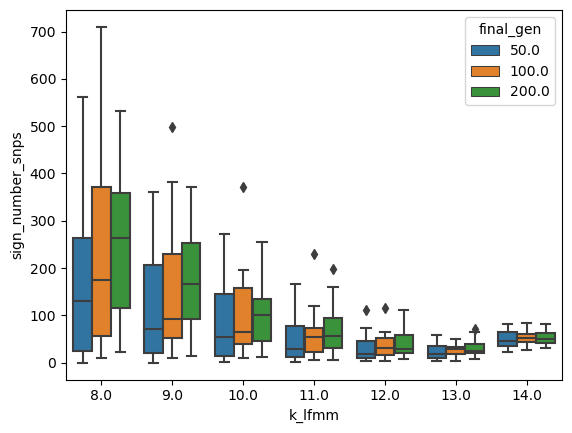

In [59]:
# Create the boxplot
#results1 = results[results['k_lfmm']!='7']
results2 = results[results['k_lfmm']!=15]

sns.boxplot(data=results2, x='k_lfmm', y='sign_number_snps', hue = 'final_gen')

# Save the plot to a file
#plt.savefig('boxplot_k_lfmm_sign_number_snps2_plusfiltering.png', dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()

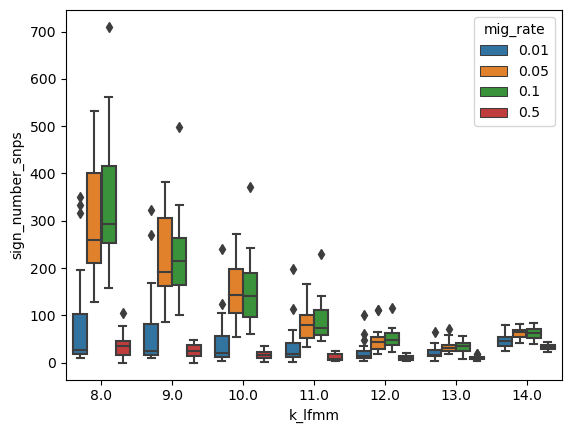

In [62]:
results2 = results[results['k_lfmm']!=15]
sns.boxplot(data=results2, x='k_lfmm', y='sign_number_snps', hue = 'mig_rate')

# Save the plot to a file
#plt.savefig('boxplot_k_lfmm_sign_number_snps2_plusfiltering.png', dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()

In [63]:
bests1 = results[(results['final_gen'] == 50) & (results['mig_rate'] == 0.01)]

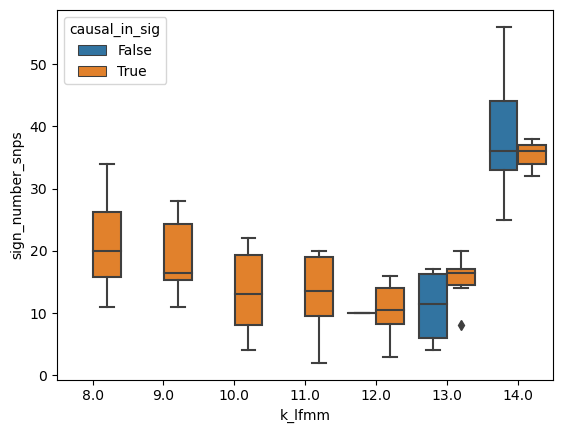

In [65]:
bests1 = bests1[bests1['k_lfmm']!=15]

sns.boxplot(data=bests1, x='k_lfmm', y='sign_number_snps', hue = 'causal_in_sig')

# Save the plot to a file
#plt.savefig('boxplot_k_lfmm_sign_number_snps2_plusfiltering.png', dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()

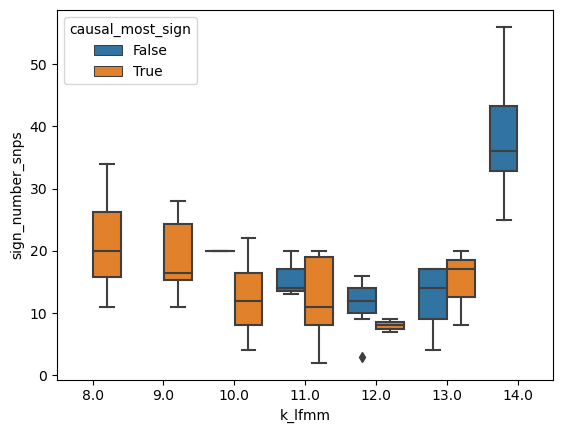

In [66]:
bests1 = bests1[bests1['k_lfmm']!=15]

sns.boxplot(data=bests1, x='k_lfmm', y='sign_number_snps', hue = 'causal_most_sign')

# Save the plot to a file
#plt.savefig('boxplot_k_lfmm_sign_number_snps2_plusfiltering.png', dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()

In [30]:
bests1.sort_values('causal_most_sign').head(10)

,pops_survived,no_cline_snps,pos_cline_snps,neg_cline_snps,causal_cline,analyzed_snps,sign_number_snps,causal_present,causal_in_sig,causal_most_sign,allele1_fix,allele2_fix,k_lfmm,sel_strength,mig_rate,final_gen,runid,cline_snps,finalno_cline_snps_gen
98,17,7022,837.0,807.0,green,5595.0,20.0,True,True,False,False,False,10.0,4.0,0.01,50.0,823280,1644,7022.0
0,17,6941,758.0,815.0,green,5535.0,20.0,True,True,True,False,False,8.0,5.0,0.01,50.0,793549,1573,6941.0
86,17,7177,737.0,829.0,green,5612.0,22.0,True,True,True,False,False,10.0,4.0,0.01,50.0,790333,1566,7177.0
96,17,7022,837.0,807.0,green,5595.0,34.0,True,True,True,False,False,8.0,4.0,0.01,50.0,823280,1644,7022.0
97,17,7022,837.0,807.0,green,5595.0,28.0,True,True,True,False,False,9.0,4.0,0.01,50.0,823280,1644,7022.0
102,17,6839,883.0,935.0,green,5526.0,27.0,True,True,True,False,False,8.0,4.0,0.01,50.0,300061,1818,6839.0
103,17,6839,883.0,935.0,green,5526.0,25.0,True,True,True,False,False,9.0,4.0,0.01,50.0,300061,1818,6839.0
85,17,7177,737.0,829.0,green,5612.0,17.0,True,True,True,False,False,9.0,4.0,0.01,50.0,790333,1566,7177.0
104,17,6839,883.0,935.0,green,5526.0,14.0,True,True,True,False,False,10.0,4.0,0.01,50.0,300061,1818,6839.0
145,17,6896,900.0,802.0,green,5632.0,16.0,True,True,True,False,False,9.0,4.0,0.01,50.0,549106,1702,6896.0


In [31]:
bests1.groupby('k_lfmm')['causal_most_sign'].value_counts()

k_lfmm  causal_most_sign
8.0     True                12
9.0     True                12
10.0    True                11
        False                1
Name: count, dtype: int64

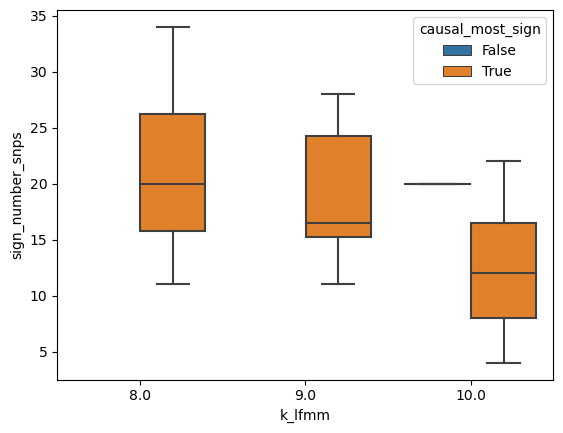

In [32]:
sns.boxplot(data=bests1, x='k_lfmm', y='sign_number_snps', hue = 'causal_most_sign')

# Save the plot to a file
#plt.savefig('boxplot_k_lfmm_sign_number_snps2_plusfiltering.png', dpi=300, bbox_inches='tight')

# Show the plot (optional)
plt.show()

In [ ]:
pop17 : 9 
pop16: 9 
pop14: 9 
pop13: 9 
pop12: 9 
pop11: 9 
pop11: 9 
pop11: 9 
pop11: 9 
pop11: 9 
pop11: 9 

In [544]:
#sns.barplot(data = results, x='k_lfmm', y='causal_most_sign')

<Axes: xlabel='k_lfmm', ylabel='causal_in_sig'>

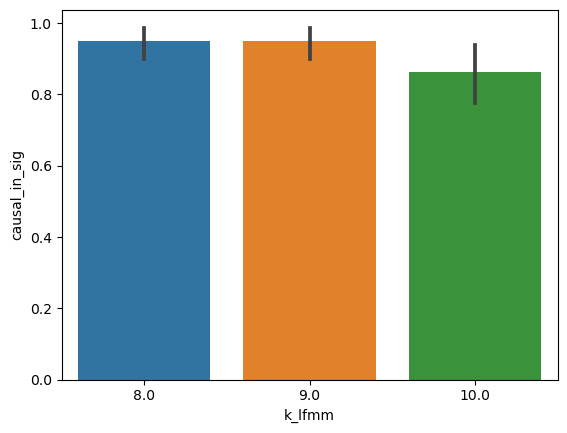

In [33]:
sns.barplot(data = results, x='k_lfmm', y='causal_in_sig')
#plt.savefig('boxplot_k_lfmm_causalinsign_plusfiltering.png', dpi=300, bbox_inches='tight')

In [34]:
results.groupby('k_lfmm')['causal_most_sign'].mean()

k_lfmm
8.0     0.0125
9.0     0.0125
10.0    0.0125
Name: causal_most_sign, dtype: object

In [35]:
results.sort_values('causal_in_sig').head(20)

,pops_survived,no_cline_snps,pos_cline_snps,neg_cline_snps,causal_cline,analyzed_snps,sign_number_snps,causal_present,causal_in_sig,causal_most_sign,allele1_fix,allele2_fix,k_lfmm,sel_strength,mig_rate,final_gen,runid,cline_snps,finalno_cline_snps_gen
119,17,4160,2263.0,2266.0,NaN,5381.0,180.0,False,False,False,NaN,NaN,10.0,5.0,0.05,100.0,279586,4529,4160.0
92,17,2699,3035.0,2452.0,green,5291.0,18.0,True,False,False,False,False,10.0,5.0,0.50,200.0,702492,5487,2699.0
194,17,2125,3304.0,3128.0,green,5387.0,19.0,True,False,False,False,False,10.0,4.0,0.50,200.0,972359,6432,2125.0
23,17,1811,3527.0,2868.0,red,5291.0,16.0,True,False,False,False,False,10.0,4.0,0.50,200.0,163090,6395,1811.0
21,17,1811,3527.0,2868.0,red,5291.0,77.0,True,False,False,False,False,8.0,4.0,0.50,200.0,163090,6395,1811.0
91,17,2699,3035.0,2452.0,green,5291.0,15.0,True,False,False,False,False,9.0,5.0,0.50,200.0,702492,5487,2699.0
137,17,2040,3192.0,2877.0,green,5403.0,12.0,True,False,False,False,False,10.0,4.0,0.50,100.0,297441,6069,2040.0
224,17,2332,3123.0,2894.0,green,5581.0,11.0,True,False,False,False,False,10.0,4.0,0.50,50.0,771355,6017,2332.0
136,17,2040,3192.0,2877.0,green,5403.0,24.0,True,False,False,False,False,9.0,4.0,0.50,100.0,297441,6069,2040.0
135,17,2040,3192.0,2877.0,green,5403.0,19.0,True,False,False,False,False,8.0,4.0,0.50,100.0,297441,6069,2040.0


In [36]:
results['causal_in_sig'].sort_values()

119    False
92     False
194    False
23     False
21     False
       ...  
86      True
87      True
88      True
90      True
239     True
Name: causal_in_sig, Length: 240, dtype: object

<Axes: xlabel='final_gen', ylabel='mig_rate'>

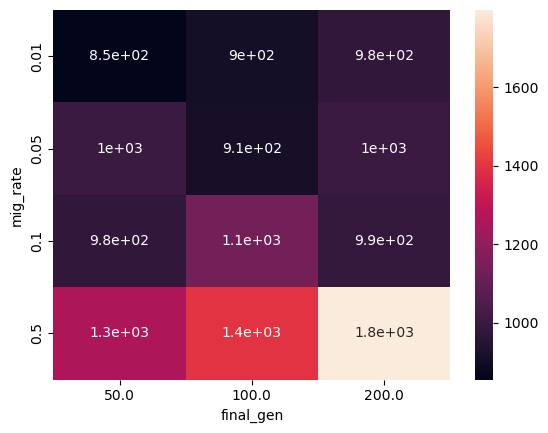

In [67]:
pivot = pd.pivot_table(data = results[results['causal_in_sig']==True] , index = 'mig_rate', columns = 'final_gen', values = 'sign_number_snps', aggfunc='mean')
sns.heatmap(pivot, annot=True)

In [262]:
results['filtering'] = 0.05

In [263]:
#results.to_csv('results_filtering.csv',index=None)

In [46]:
bests = results[(results['final_gen'] == 50)] #  & (results['mig_rate'] == 0.5	)]

<Axes: xlabel='k_lfmm', ylabel='sign_number_snps'>

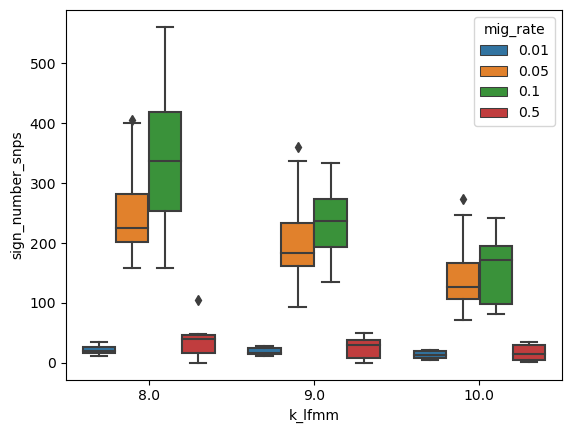

In [47]:
sns.boxplot(data=bests, x='k_lfmm', y='sign_number_snps', hue = 'mig_rate')

In [43]:
bests.groupby('k_lfmm')['sign_number_snps'].mean()

k_lfmm
8.0     37.166667
9.0     24.500000
10.0    16.500000
Name: sign_number_snps, dtype: float64

In [44]:
bests['sign_number_snps'].value_counts()

sign_number_snps
2.0      4
17.0     3
0.0      2
5.0      2
47.0     2
35.0     2
31.0     2
37.0     2
41.0     2
8.0      1
33.0     1
38.0     1
11.0     1
43.0     1
46.0     1
3.0      1
105.0    1
6.0      1
16.0     1
49.0     1
29.0     1
25.0     1
48.0     1
27.0     1
Name: count, dtype: int64

In [559]:
bests[bests['k_lfmm'] == 9]


,pops_survived,no_cline_snps,pos_cline_snps,neg_cline_snps,causal_cline,analyzed_snps,sign_number_snps,causal_present,causal_in_sig,causal_most_sign,allele1_fix,allele2_fix,k_lfmm,sel_strength,mig_rate,final_gen,runid,cline_snps,finalno_cline_snps_gen
8,17,1399,172.0,187.0,green,1108.0,7.0,True,True,True,False,False,9.0,5.0,0.01,50.0,793549,359,1399.0
68,17,1467,143.0,157.0,green,1102.0,9.0,True,True,True,False,False,9.0,5.0,0.01,50.0,808608,300,1467.0
128,17,1309,146.0,142.0,green,979.0,19.0,True,True,True,False,False,9.0,5.0,0.01,50.0,898516,288,1309.0
200,17,1423,198.0,200.0,green,1169.0,16.0,True,True,True,False,False,9.0,5.0,0.01,50.0,445655,398,1423.0
212,17,1498,153.0,131.0,red,1053.0,4.0,True,True,True,False,True,9.0,4.0,0.01,50.0,280689,284,1498.0
224,17,1617,169.0,158.0,green,1169.0,7.0,True,True,True,False,False,9.0,5.0,0.01,50.0,966338,327,1617.0
344,17,1424,131.0,167.0,green,1084.0,8.0,True,True,True,False,False,9.0,4.0,0.01,50.0,790333,298,1424.0
392,17,1607,138.0,152.0,green,1183.0,6.0,True,True,True,False,False,9.0,4.0,0.01,50.0,823280,290,1607.0
416,17,1568,180.0,174.0,green,1251.0,7.0,True,True,True,False,False,9.0,4.0,0.01,50.0,300061,354,1568.0
584,17,1487,180.0,159.0,green,1135.0,3.0,True,True,True,False,False,9.0,4.0,0.01,50.0,549106,339,1487.0


In [568]:
#results.to_csv('17pops_multiplek_div_200ne.csv')

In [565]:
bests['runid'].unique()

array(['793549', '808608', '898516', '445655', '280689', '966338',
       '790333', '823280', '300061', '549106', '926430', '691638'],
      dtype=object)

793549


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


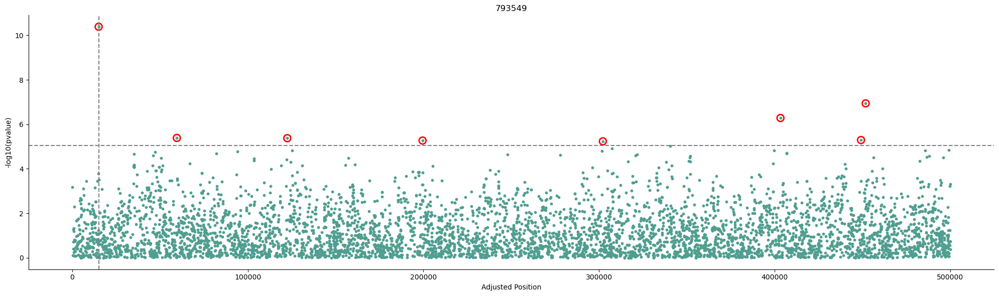

921476


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


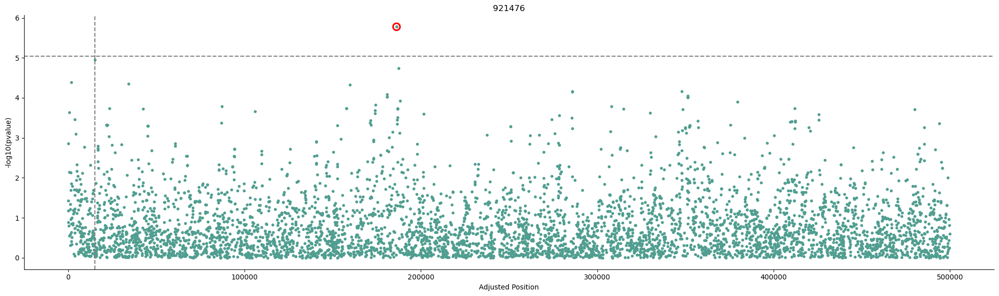

603395


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


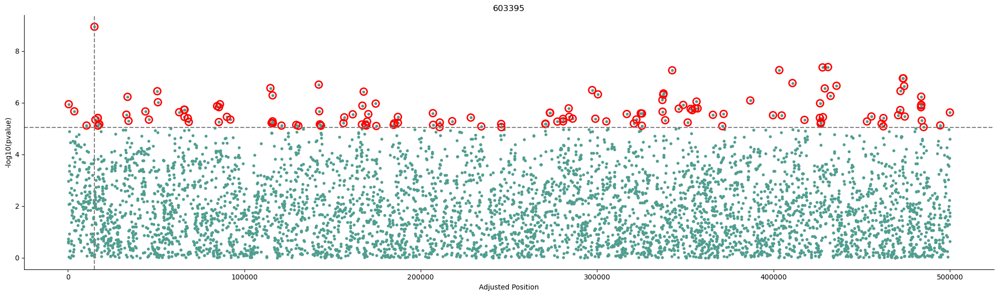

759603


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


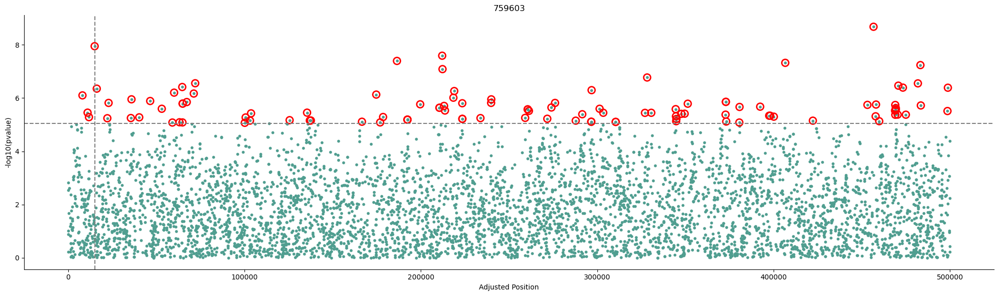

808608


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


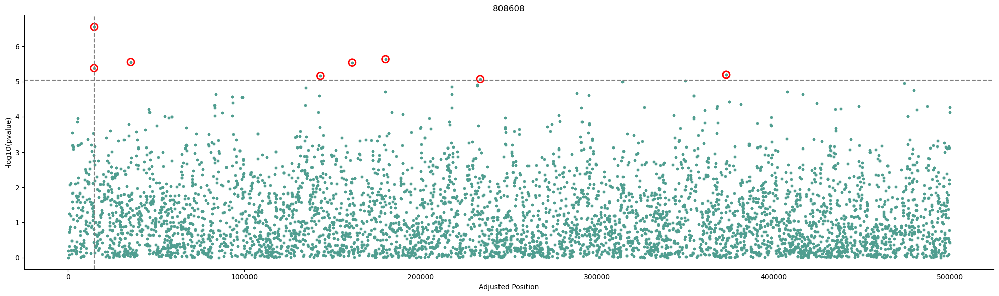

101619


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


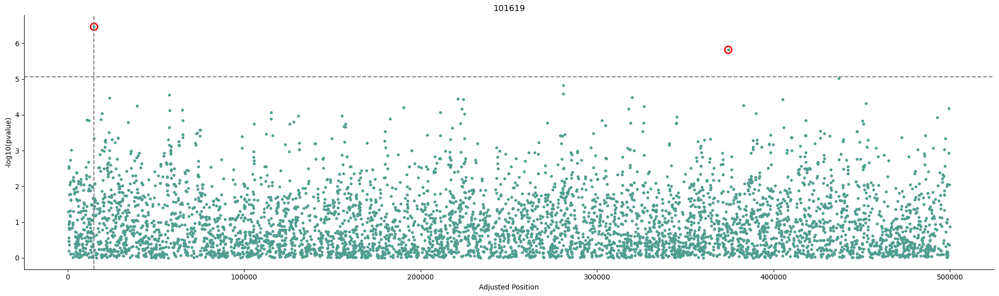

383308


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


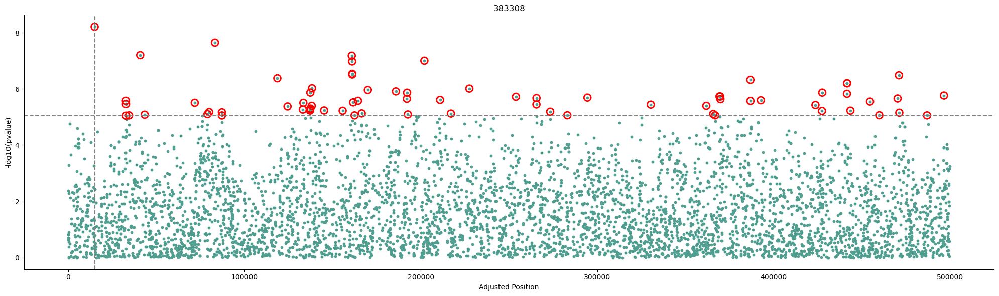

154483


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


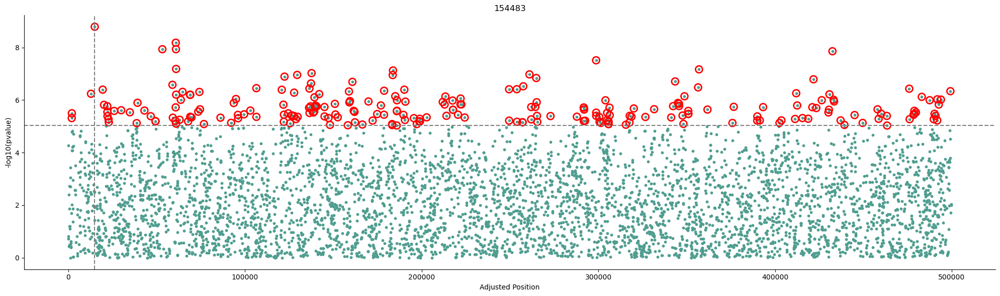

898516


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


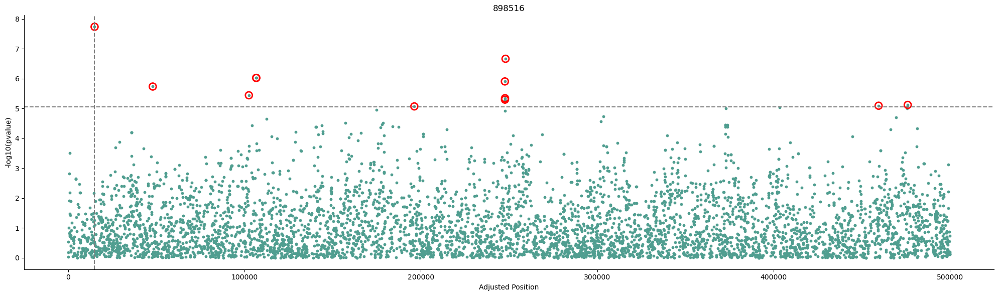

829775


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


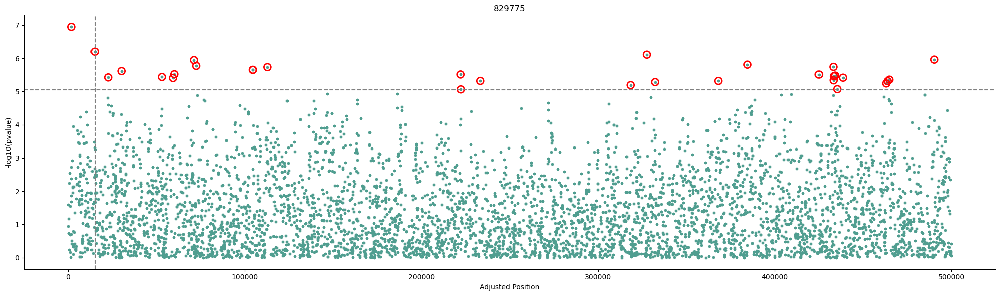

250193


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


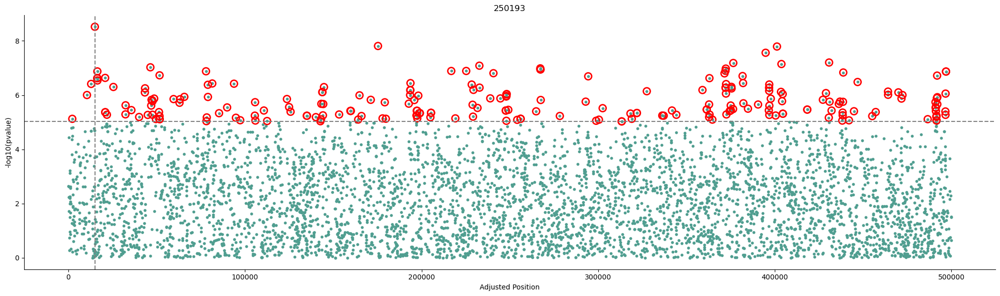

445655


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


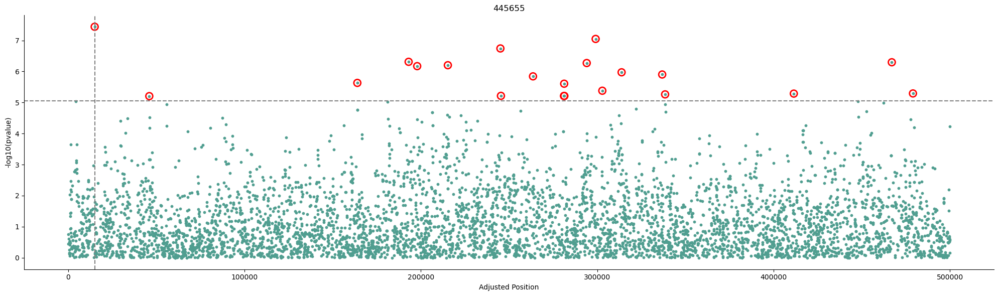

280689


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


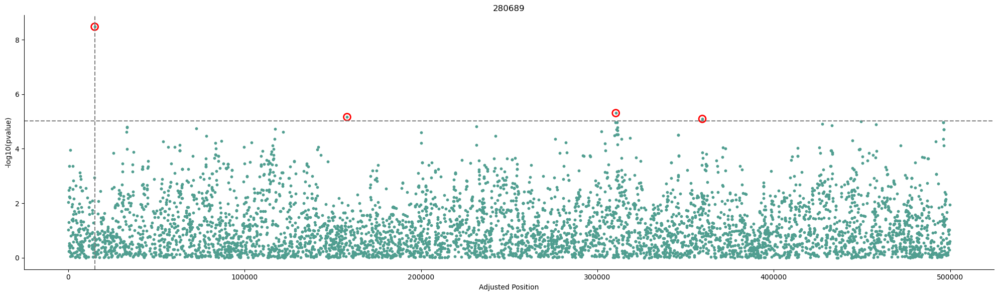

966338


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


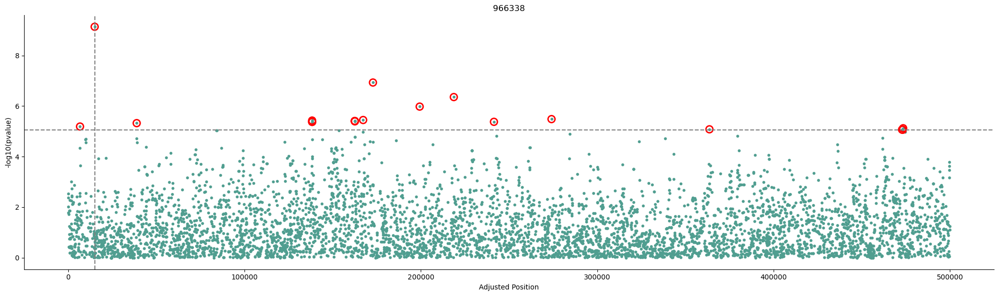

218736


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


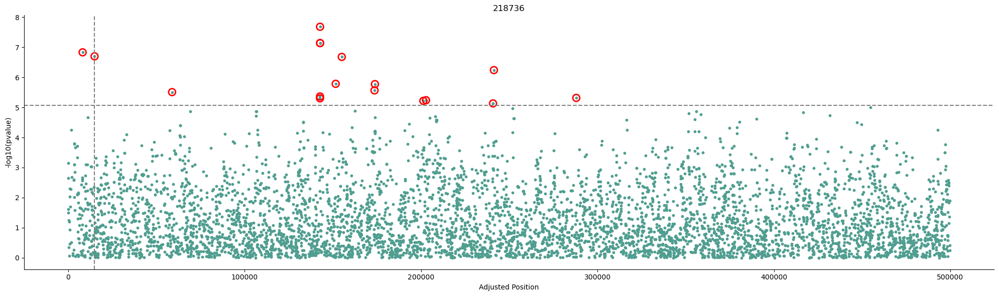

703194


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


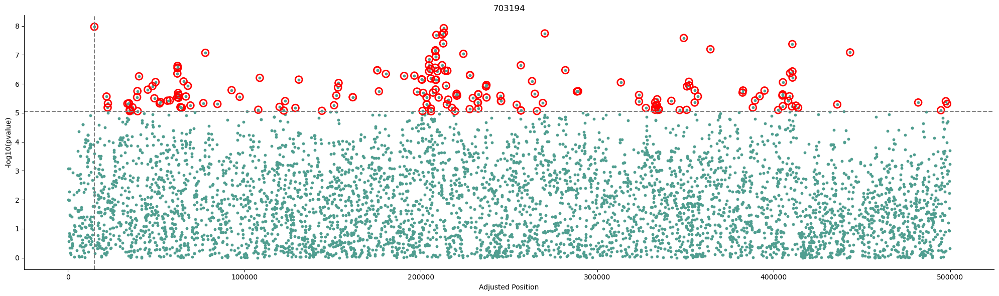

173654


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


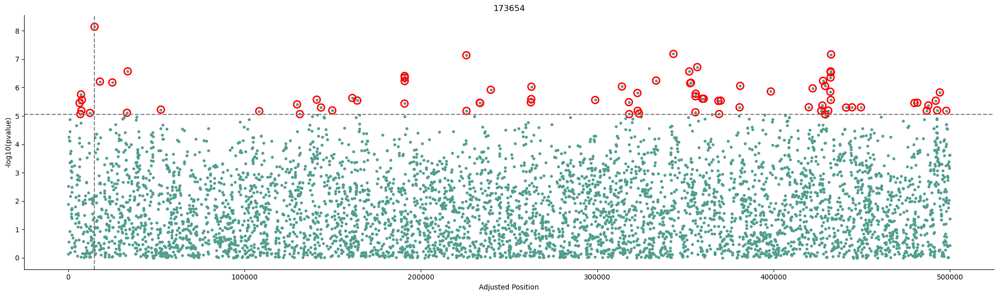

791029


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


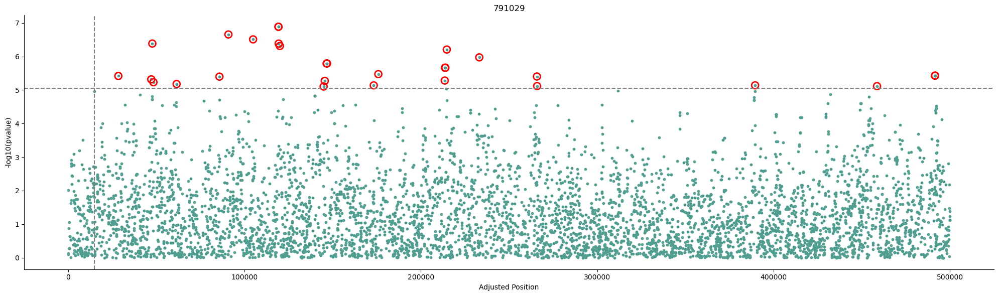

593967


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


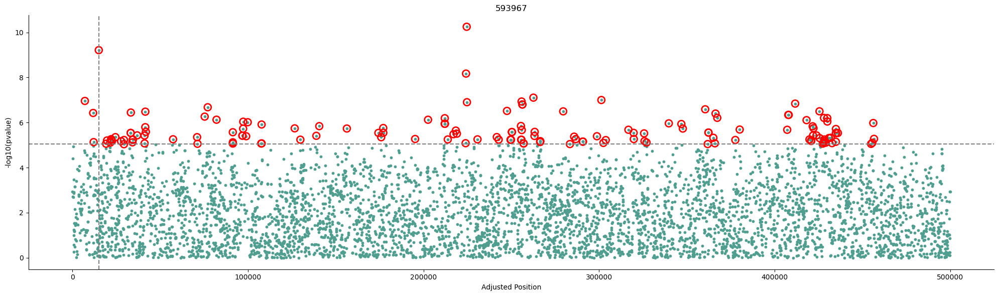

432712


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


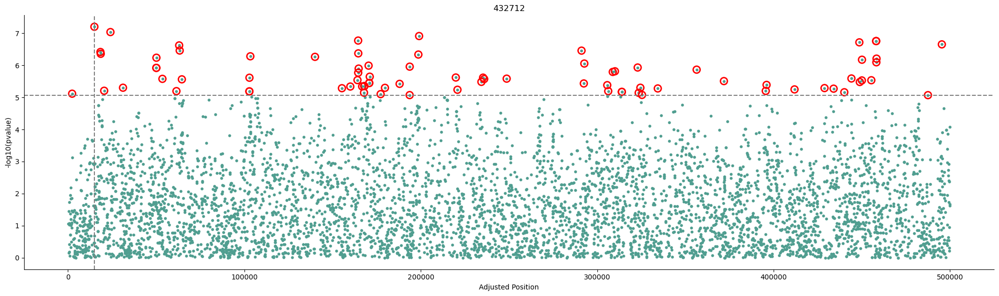

875216


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


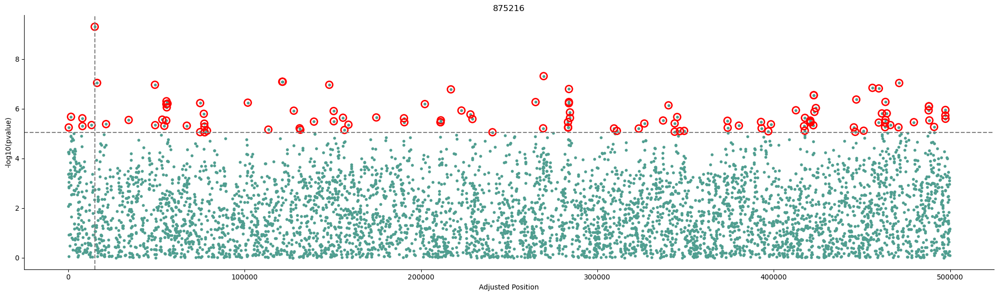

790333


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


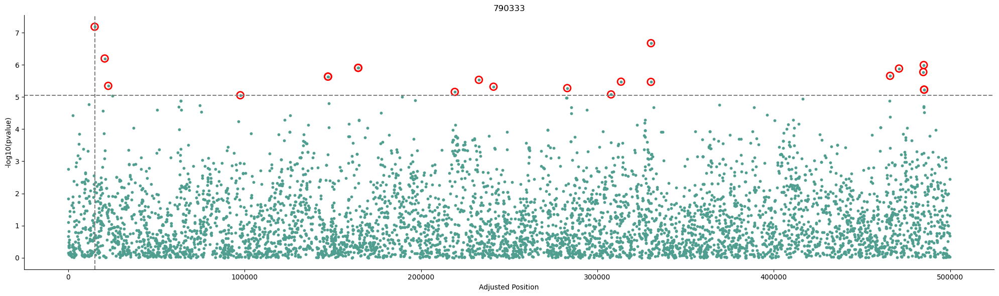

709542


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


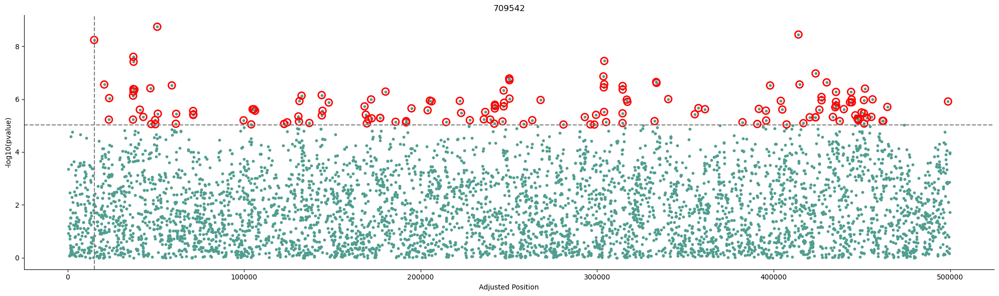

284179


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


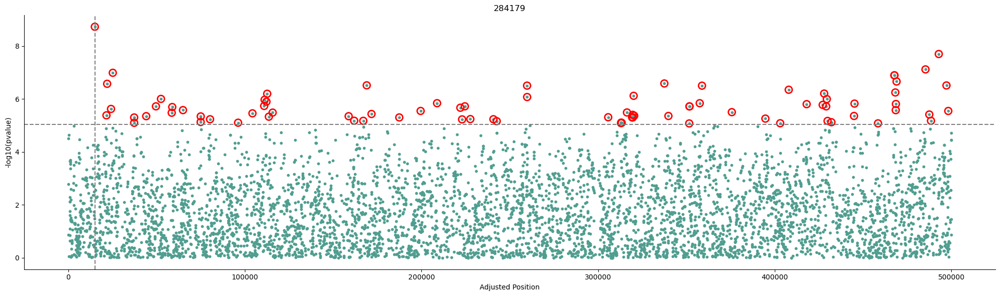

823280


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


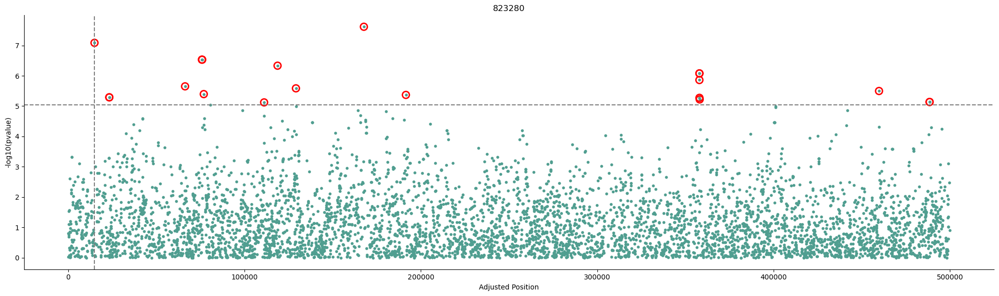

363121


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


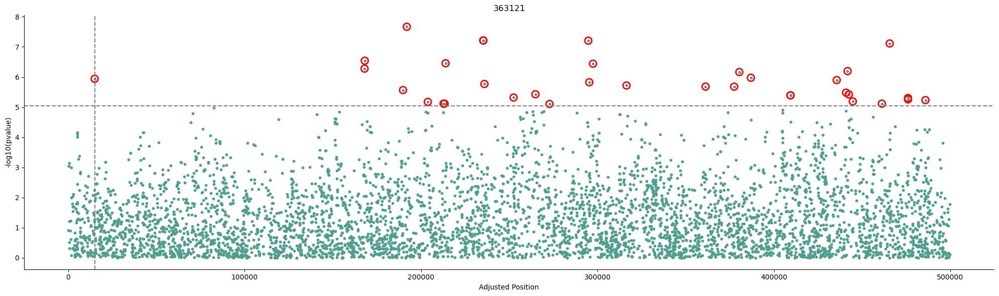

300061


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


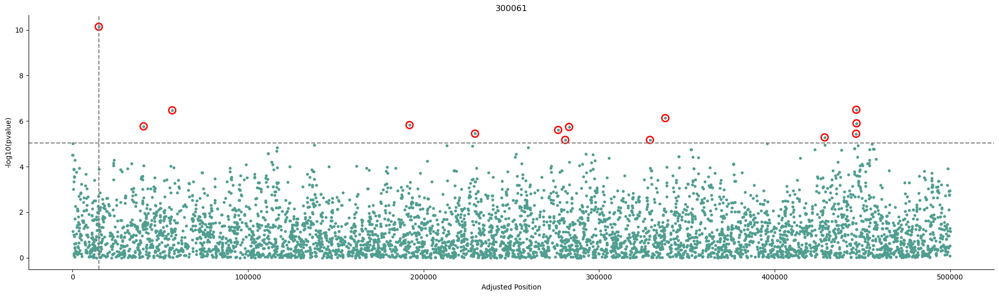

707826


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


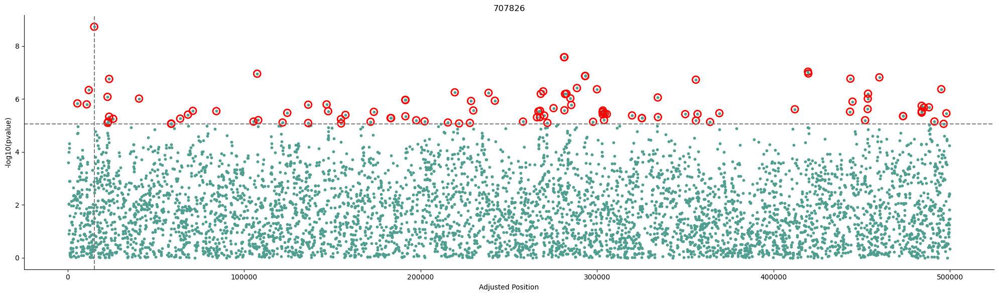

374725


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


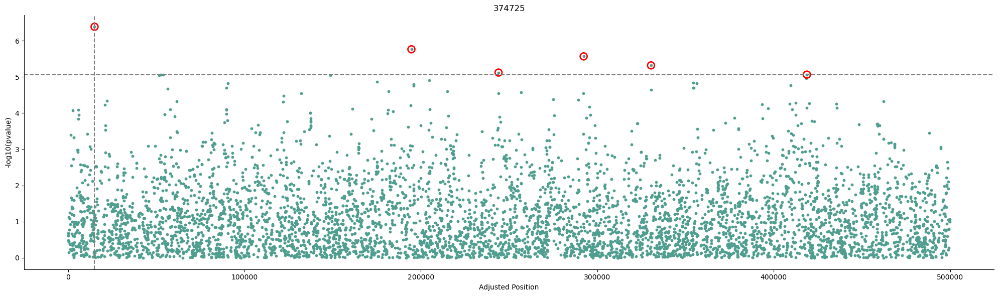

376662


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


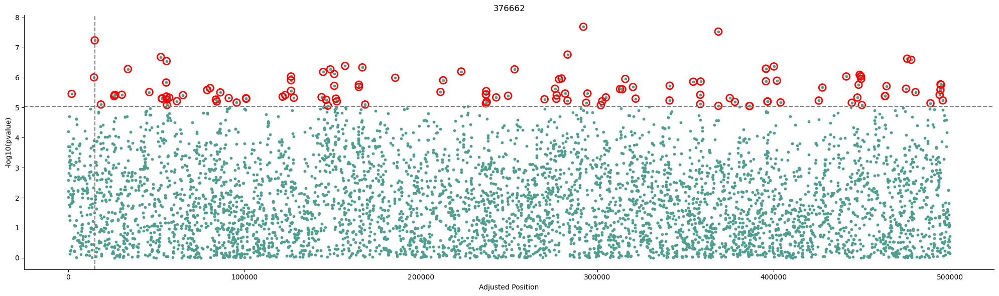

817291


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


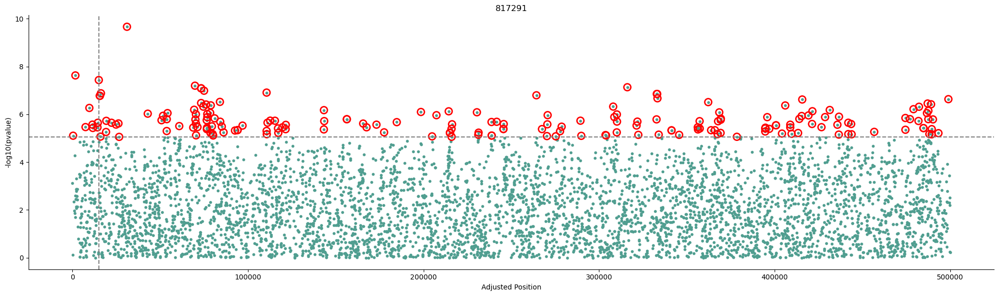

660652


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


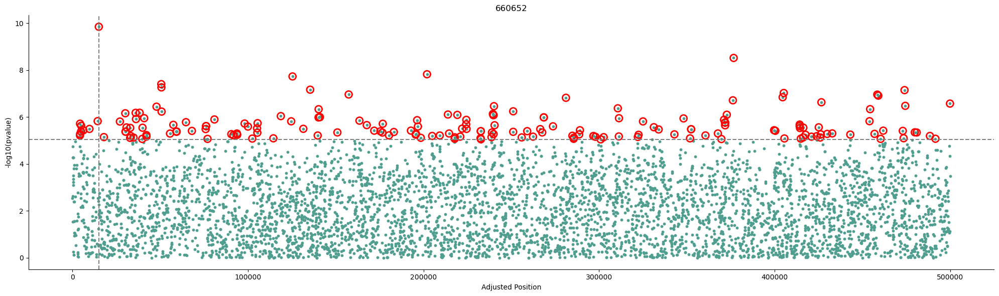

289531


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


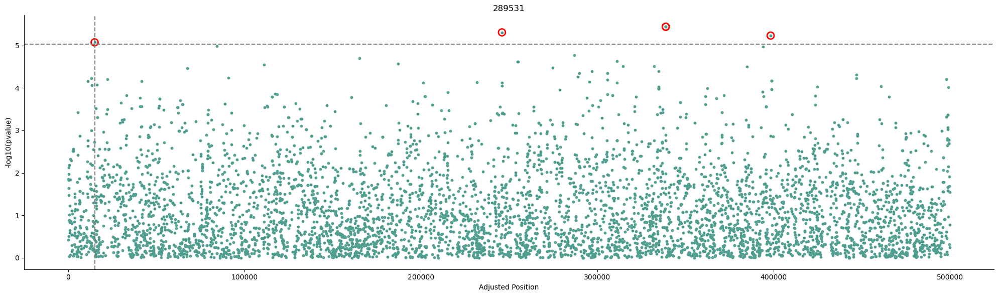

549106


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


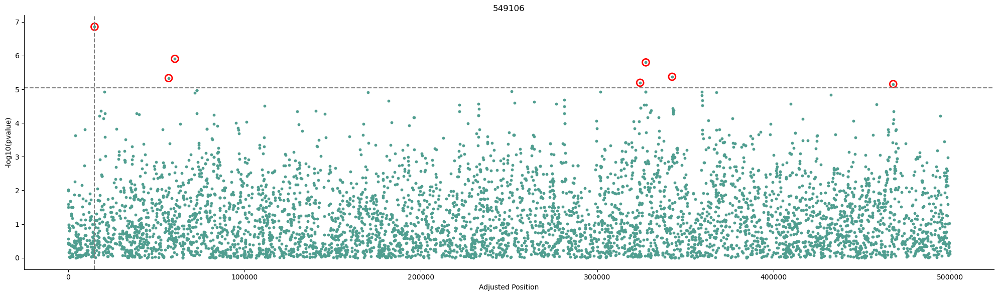

822248


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


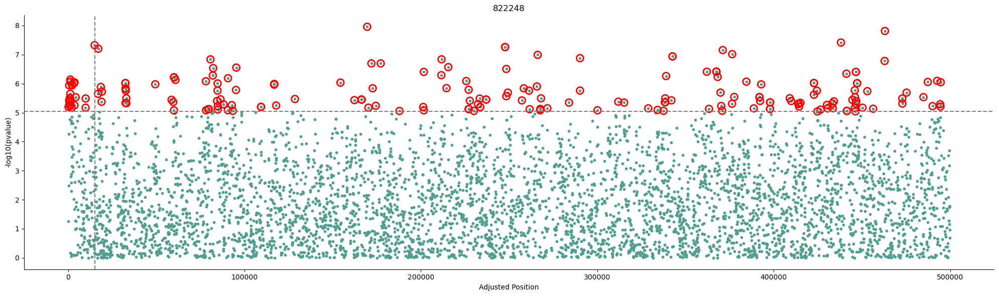

222145


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


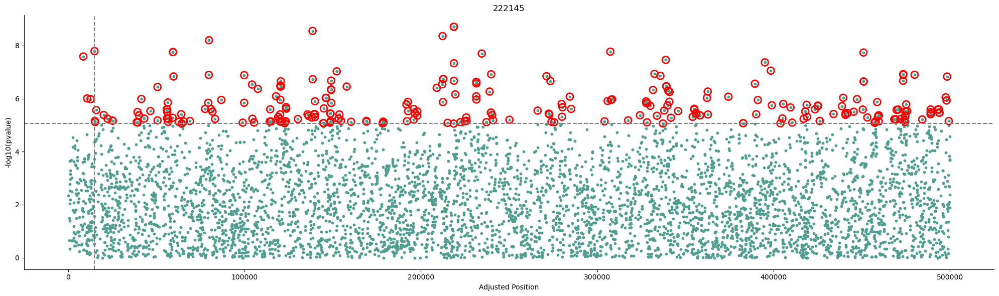

593131


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


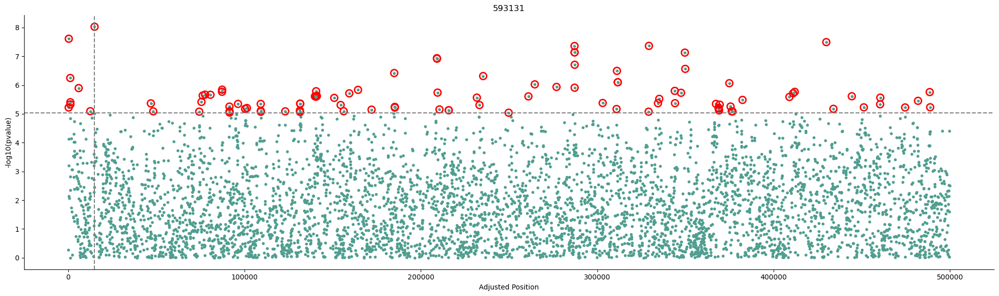

139592


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


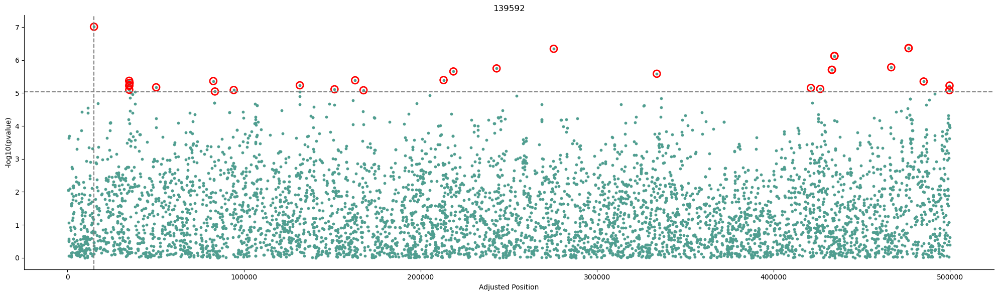

226152


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


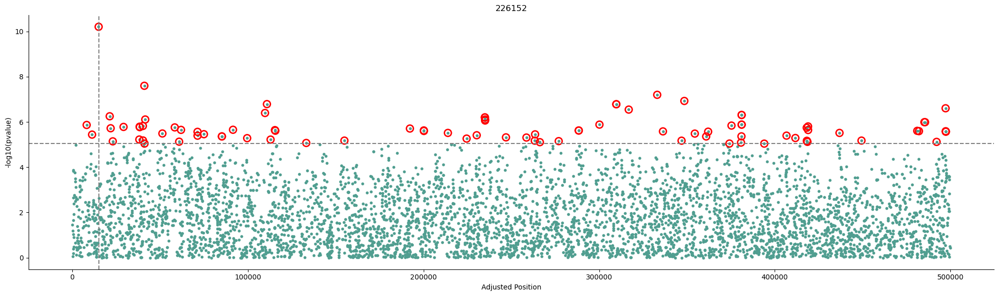

763425


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


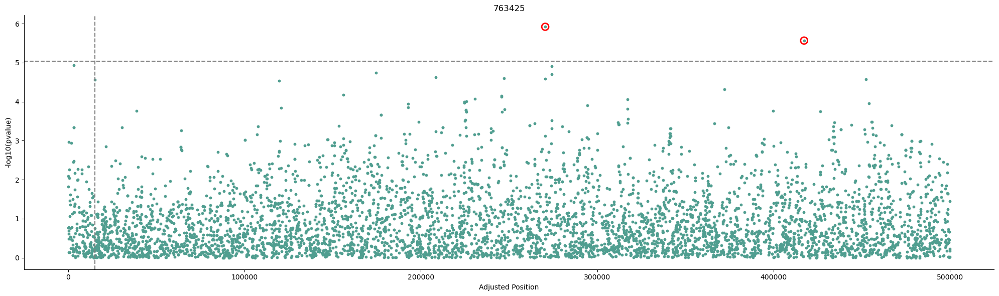

944672


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


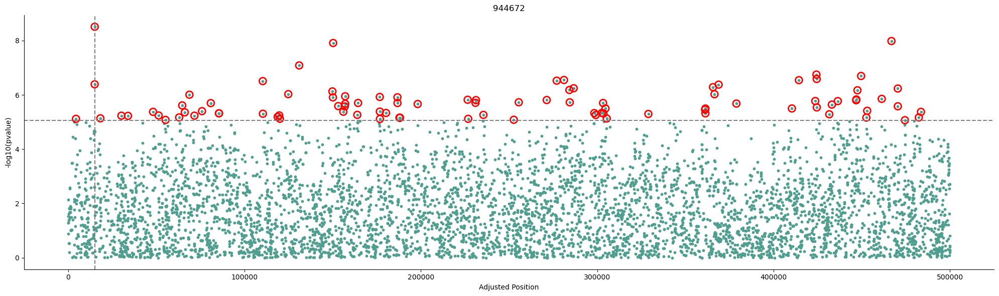

926430


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


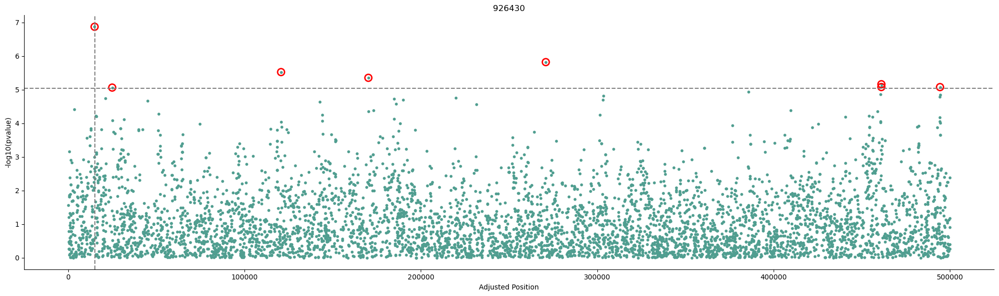

321040


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


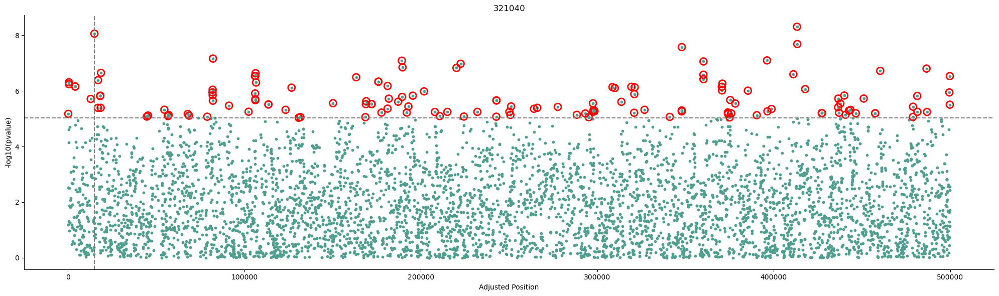

771355


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


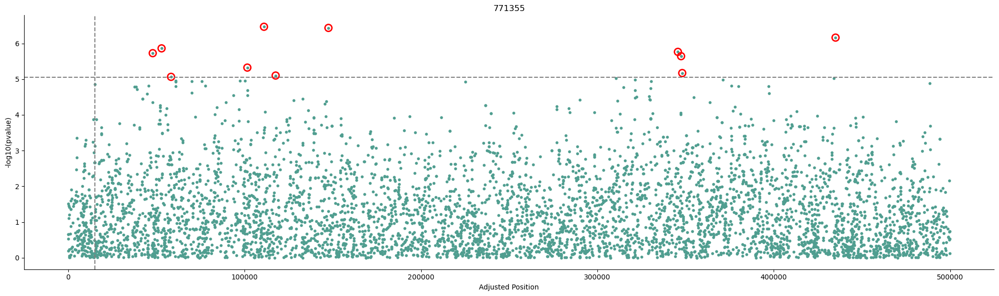

247997


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


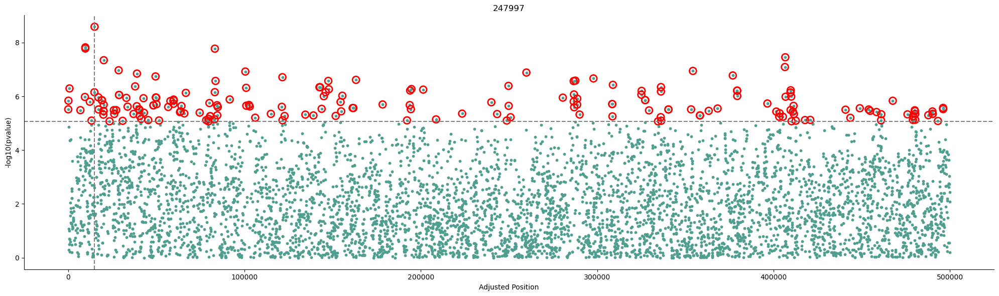

664124


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


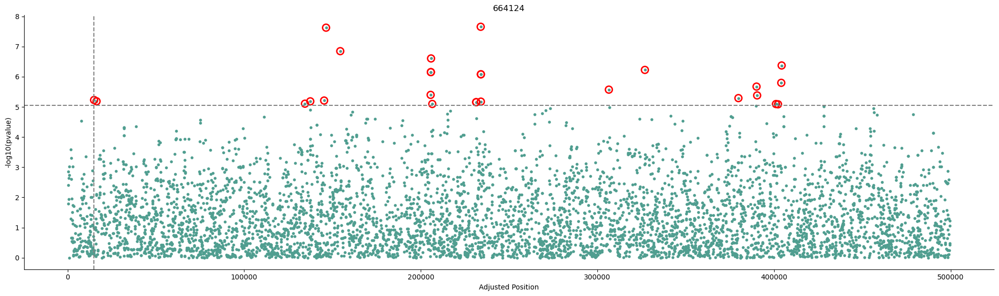

691638


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


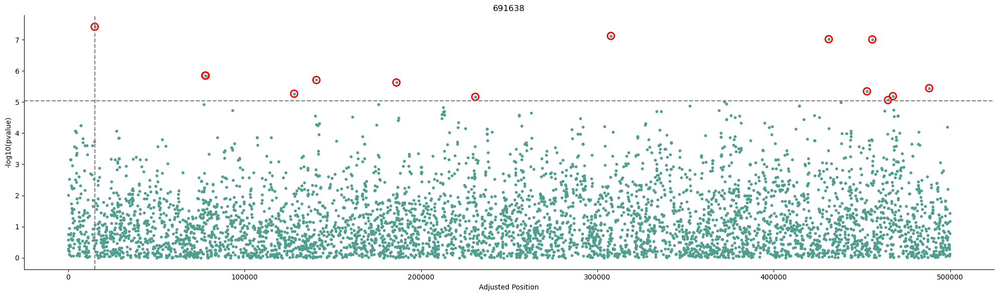

111579


/tmp/ipykernel_684499/8282402.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)


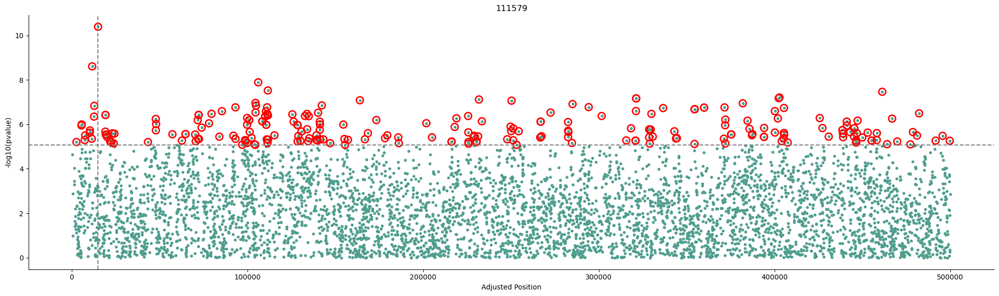

In [70]:
for runid in bests['runid'].unique():
    print(runid)
    k =10
    p_values = pd.read_csv(f'lfmm/results/wo_calibration_pvalue_full_genome_{runid}_k{k}.csv').reset_index().drop( 'Unnamed: 0', axis=1)
    left_pos = pd.read_csv(f'lfmm/left_pos/left_pos_{runid}.csv')
    p_values = p_values.merge(left_pos, left_on = 'index', right_on = 'ignore', how = 'inner').drop( ['index', 'ignore'], axis=1)
    
    ts = 0.05/len(p_values)
    
    p_values.columns = ['pvalue', 'pos']
    
    threshold_value = 0.05 / len(p_values)
    
    p_values['chrom'] =1 
    
    df = p_values.copy()
    
    colors = sns.color_palette("crest", n_colors = 5)
    
    # Parsing chromosome number and position
    df['chromosome'] = df['chrom']
    df['position'] = df['pos']
    df['-log10(pvalue)'] = -np.log10(df['pvalue'])
    
    # Calculate the offset for each chromosome to prevent overlap
    chromosome_offsets = {}
    offset = 0
    for chrom in sorted(df['chromosome'].unique()):
        chromosome_offsets[chrom] = offset
        max_position = df[df['chromosome'] == chrom]['position'].max()
        offset += max_position + 1000000  # Adding 1 million as a buffer between chromosomes
    
    # Apply offsets to positions
    df['adjusted_position'] = df.apply(lambda row: row['position'] + chromosome_offsets[row['chromosome']], axis=1)
    
    # Creating the Manhattan plot
    plt.figure(figsize=(20, 6))
    
    for chrom in sorted(df['chromosome'].unique()):
        subset = df[df['chromosome'] == chrom]
        plt.scatter(subset['adjusted_position'], subset['-log10(pvalue)'], c=colors[chrom % len(colors)], label=f'Chr {chrom}', s=10)
    
    
    # Highlight clumped SNPs
    
    # Aesthetics
    plt.xlabel('Adjusted Position')
    plt.ylabel('-log10(pvalue)')
    #plt.title('Manhattan Plot')
    #plt.grid(axis='y')
    #plt.legend(title="Chromosome", bbox_to_anchor=(1.05, 1), loc='upper left')
    ax = plt.gca()  # Get current axes
    ax.spines['top'].set_visible(False)  # Remove the top spine
    ax.spines['right'].set_visible(False)
    # Threshold line (optional)
    threshold = -np.log10(threshold_value)
    plt.axhline(y=threshold, color='grey', linestyle='dashed')
    #plt.title(f'{biovar}')  # Set the title
    
    significant_snps = df[df['-log10(pvalue)'] > threshold]
    
    # Highlight significant SNPs with red circles
    plt.scatter(significant_snps['adjusted_position'], significant_snps['-log10(pvalue)'],
                facecolors='none', edgecolors='red', s=100, linewidths=2, label='Significant SNPs')
    
    
    #intervals = [(0, 50), (5000, 5050), (10000, 10050), (15000, 15050), (20000, 20050), (25000, 25050), (30000, 30050), (35000, 35050), (40000, 40050), (45000, 45050)]
    intervals = [(15000, 15050)]
    for interval in intervals:
        middle = (interval[0] + interval[1]) / 2
        plt.axvline(x=middle, color='grey', linestyle='dashed')
    plt.title(runid)
    # Show the plot
    plt.tight_layout()
    #plt.savefig(wd + f'manhattan_{biovar}.png')
    plt.show()
